In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LassoCV, RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [2]:
#from google.colab import drive
#import os

# Mount Google Drive
#drive.mount('/content/drive', force_remount=True)

# Specify the folder you want to access
#project_folder = "/content/drive/My Drive/bird_dataset/"

In [3]:
# file_path = os.path.join(project_folder, "EL_data.csv")

df = pd.read_csv("EL_data.csv")

## EDA

In [4]:
df.describe()

,meanVIR,X,Y,AgLandCover,emMarshCover,decForestCover,seasMeanNDVI,coniferLandCover,seasStdNDVI,devLandCover,dAtl,ALAN,dBrL,dRdr
count,166296.000000,6.286030e+05,6.286030e+05,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000,628603.000000
mean,0.894628,4.247639e+05,4.575297e+06,0.167259,0.012490,0.567326,0.693412,0.093097,0.131761,0.110690,35.446358,0.320199,104.999295,93.213440
std,0.725938,3.114738e+05,2.998493e+05,0.234618,0.071719,0.289724,0.071957,0.120915,0.035618,0.198651,50.976226,0.746700,57.628001,43.113088
min,0.010236,-2.770000e+05,4.050000e+06,0.000000,0.000000,0.000000,-0.160800,0.000000,0.000000,0.000000,0.000000,0.000630,0.000000,0.033348
25%,0.391948,1.820000e+05,4.320000e+06,0.000000,0.000000,0.336090,0.678800,0.008127,0.103680,0.000000,0.000000,0.039292,58.000000,61.500500
50%,0.680410,3.990000e+05,4.590000e+06,0.040984,0.000000,0.594120,0.705290,0.045070,0.131800,0.040107,0.000000,0.101260,103.230000,91.127000
75%,1.163000,6.560000e+05,4.800000e+06,0.267380,0.000000,0.821750,0.729870,0.131960,0.159450,0.101010,71.004000,0.267220,146.010000,122.000000
max,4.999100,1.130000e+06,5.270000e+06,1.000000,1.000000,1.000000,0.861300,1.000000,0.307300,1.000000,149.900000,18.933000,260.050000,255.170000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 628603 entries, 0 to 628602
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   meanVIR           166296 non-null  float64
 1   X                 628603 non-null  float64
 2   Y                 628603 non-null  float64
 3   AgLandCover       628603 non-null  float64
 4   emMarshCover      628603 non-null  float64
 5   decForestCover    628603 non-null  float64
 6   seasMeanNDVI      628603 non-null  float64
 7   coniferLandCover  628603 non-null  float64
 8   seasStdNDVI       628603 non-null  float64
 9   devLandCover      628603 non-null  float64
 10  dAtl              628603 non-null  float64
 11  ALAN              628603 non-null  float64
 12  dBrL              628603 non-null  float64
 13  dRdr              628603 non-null  float64
dtypes: float64(14)
memory usage: 67.1 MB


In [6]:
print(df.shape)
df.head(5)

(628603, 14)


,meanVIR,X,Y,AgLandCover,emMarshCover,decForestCover,seasMeanNDVI,coniferLandCover,seasStdNDVI,devLandCover,dAtl,ALAN,dBrL,dRdr
0,NaN,1130000.0,4990000.0,0.0,0.127160,0.67126,0.69886,0.118530,0.13995,0.050505,149.0,0.008405,224.32,150.19
1,NaN,1130000.0,4990000.0,0.0,0.020499,0.91533,0.73590,0.089566,0.10593,0.000000,149.0,0.008369,223.32,149.72
2,NaN,1130000.0,4990000.0,0.0,0.000000,0.91263,0.74003,0.138150,0.10259,0.000000,149.0,0.007116,223.27,150.58
3,NaN,1130000.0,4990000.0,0.0,0.052585,0.63815,0.74658,0.205340,0.10225,0.000000,149.0,0.004839,218.15,150.93
4,NaN,1130000.0,4990000.0,0.0,0.095501,0.72232,0.71431,0.143490,0.10054,0.067474,148.0,0.006898,220.27,149.19


In [7]:
df.tail(5)

,meanVIR,X,Y,AgLandCover,emMarshCover,decForestCover,seasMeanNDVI,coniferLandCover,seasStdNDVI,devLandCover,dAtl,ALAN,dBrL,dRdr
628598,NaN,-276000.0,4090000.0,0.00000,0.0,0.99082,0.73917,0.005660,0.16348,0.009183,0.0,0.27111,73.926,253.77
628599,NaN,-276000.0,4090000.0,0.00000,0.0,1.00000,0.75082,0.001684,0.14682,0.000000,0.0,0.22777,74.847,253.10
628600,NaN,-276000.0,4090000.0,0.00000,0.0,0.48577,0.67606,0.007547,0.12692,0.396690,0.0,0.32836,73.007,254.45
628601,NaN,-277000.0,4090000.0,0.01426,0.0,0.70766,0.71677,0.004561,0.14661,0.257580,0.0,0.36504,72.615,255.17
628602,NaN,-277000.0,4090000.0,0.00000,0.0,0.65954,0.72224,0.003649,0.14337,0.336010,0.0,0.31598,73.539,254.49


In [8]:
df.fillna(0, inplace=True)
df.head()

,meanVIR,X,Y,AgLandCover,emMarshCover,decForestCover,seasMeanNDVI,coniferLandCover,seasStdNDVI,devLandCover,dAtl,ALAN,dBrL,dRdr
0,0.0,1130000.0,4990000.0,0.0,0.127160,0.67126,0.69886,0.118530,0.13995,0.050505,149.0,0.008405,224.32,150.19
1,0.0,1130000.0,4990000.0,0.0,0.020499,0.91533,0.73590,0.089566,0.10593,0.000000,149.0,0.008369,223.32,149.72
2,0.0,1130000.0,4990000.0,0.0,0.000000,0.91263,0.74003,0.138150,0.10259,0.000000,149.0,0.007116,223.27,150.58
3,0.0,1130000.0,4990000.0,0.0,0.052585,0.63815,0.74658,0.205340,0.10225,0.000000,149.0,0.004839,218.15,150.93
4,0.0,1130000.0,4990000.0,0.0,0.095501,0.72232,0.71431,0.143490,0.10054,0.067474,148.0,0.006898,220.27,149.19


In [9]:
print(df.describe())

             meanVIR             X             Y    AgLandCover  \
count  628603.000000  6.286030e+05  6.286030e+05  628603.000000   
mean        0.236673  4.247639e+05  4.575297e+06       0.167259   
std         0.543261  3.114738e+05  2.998493e+05       0.234618   
min         0.000000 -2.770000e+05  4.050000e+06       0.000000   
25%         0.000000  1.820000e+05  4.320000e+06       0.000000   
50%         0.000000  3.990000e+05  4.590000e+06       0.040984   
75%         0.179985  6.560000e+05  4.800000e+06       0.267380   
max         4.999100  1.130000e+06  5.270000e+06       1.000000   

        emMarshCover  decForestCover   seasMeanNDVI  coniferLandCover  \
count  628603.000000   628603.000000  628603.000000     628603.000000   
mean        0.012490        0.567326       0.693412          0.093097   
std         0.071719        0.289724       0.071957          0.120915   
min         0.000000        0.000000      -0.160800          0.000000   
25%         0.000000        0.3

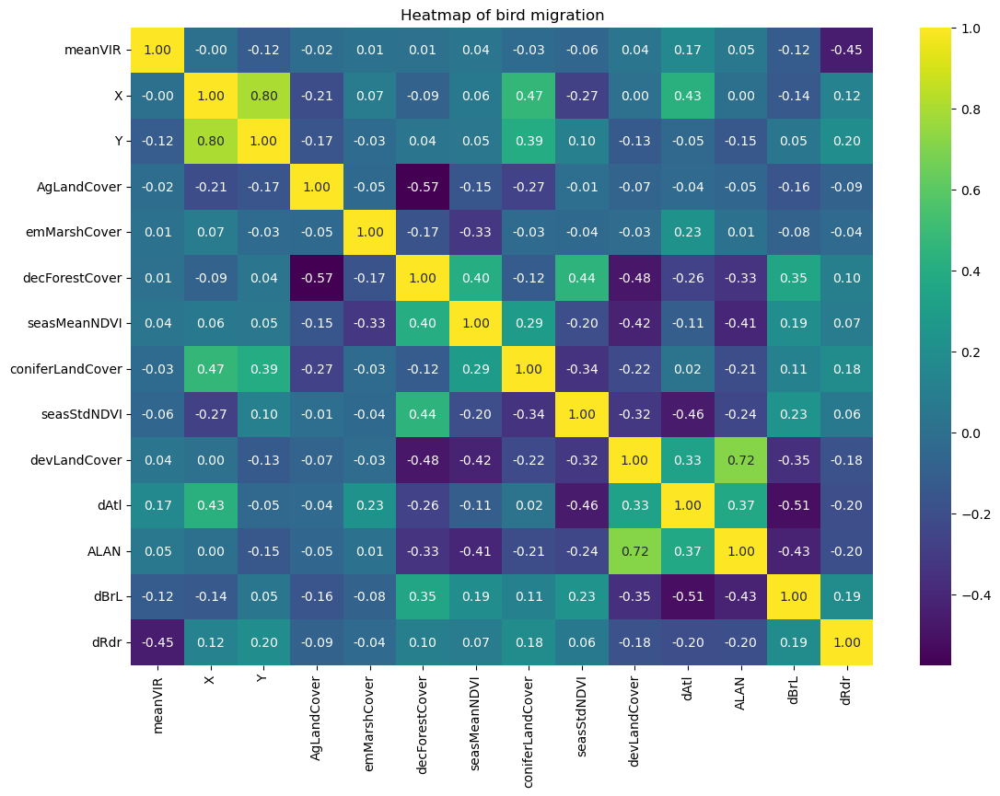

In [10]:
numerical_cols = df.select_dtypes(include=['number']).columns
numerical_df = df[numerical_cols]

correlation_matrix = numerical_df.corr()

plt.figure(figsize=(13,9))
sns.heatmap(correlation_matrix, cmap="viridis", annot=True, fmt=".2f")
plt.title("Heatmap of bird migration")
plt.show()

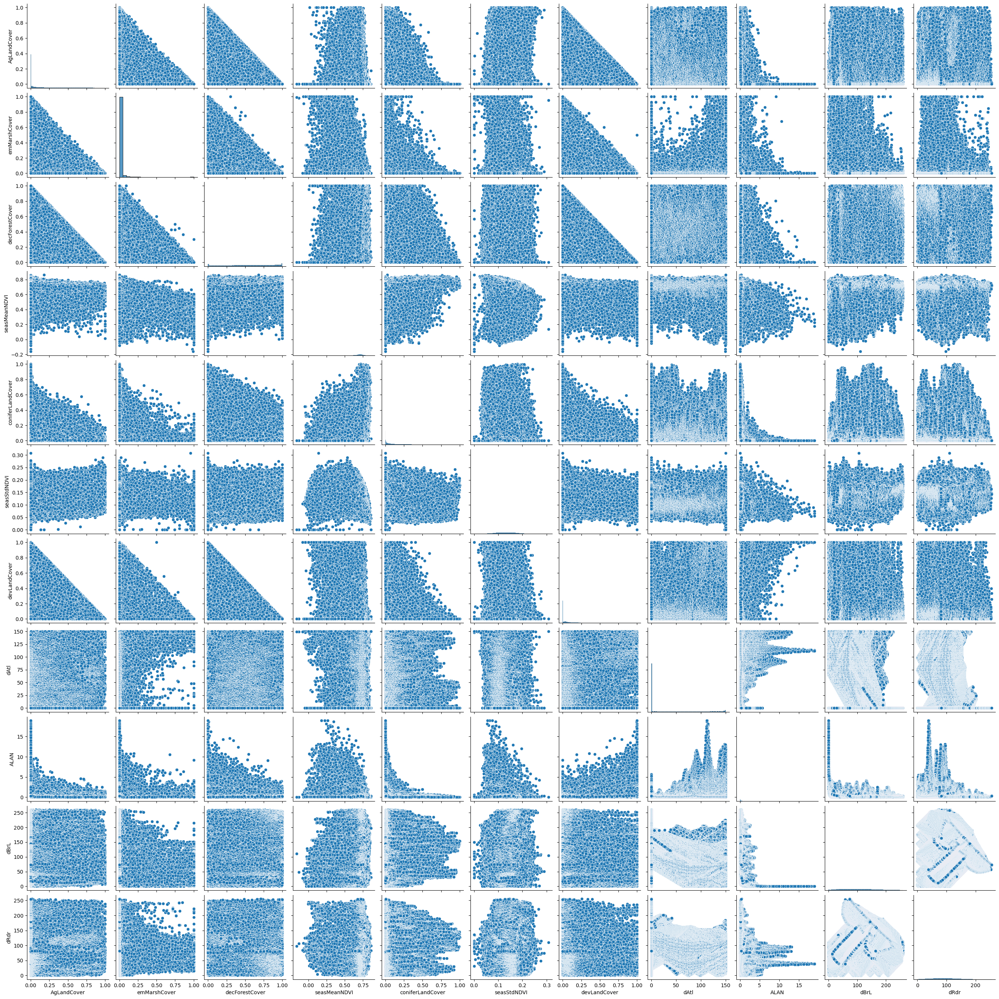

In [11]:
sns.pairplot(df, vars=['AgLandCover', 'emMarshCover', 'decForestCover', 'seasMeanNDVI', 'coniferLandCover', 'seasStdNDVI', 'devLandCover', 'dAtl', 'ALAN', 'dBrL', 'dRdr'])
plt.show()

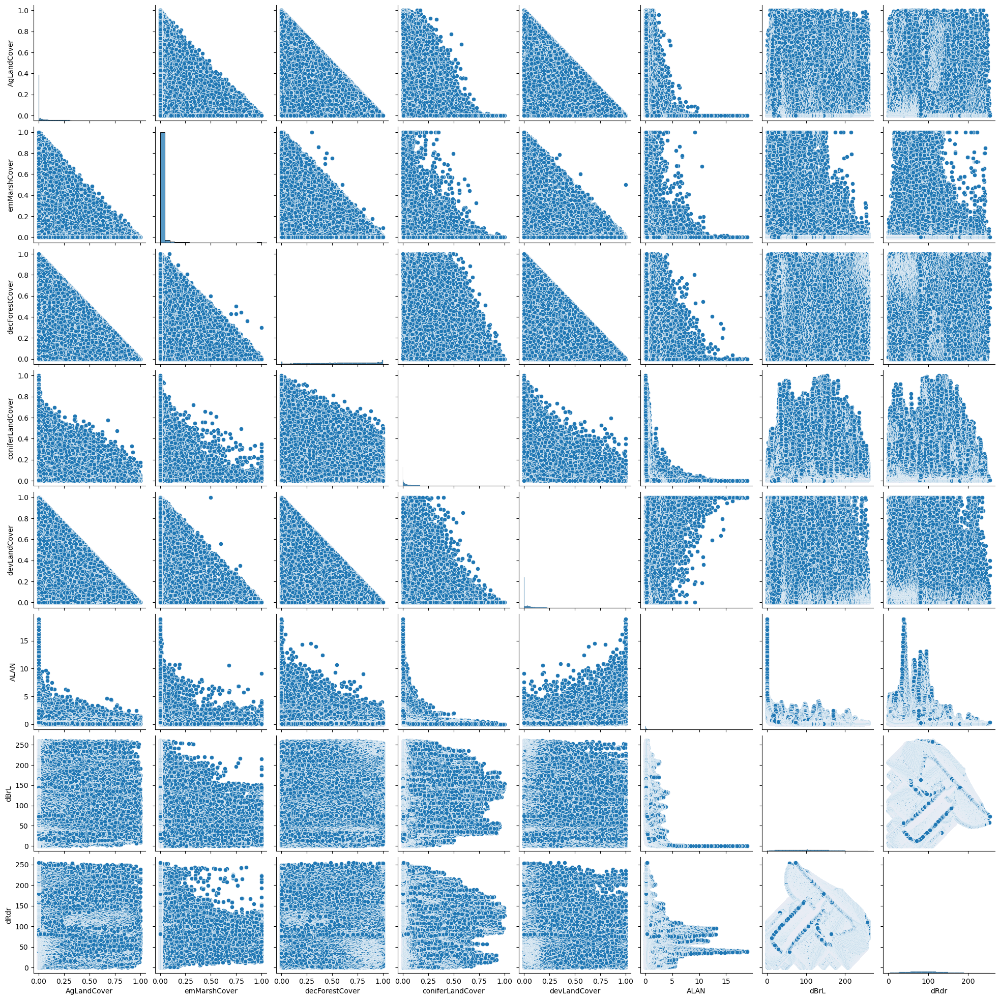

In [12]:
sns.pairplot(df, vars=['AgLandCover', 'emMarshCover', 'decForestCover', 'coniferLandCover', 'devLandCover', 'ALAN', 'dBrL', 'dRdr'])
plt.show()

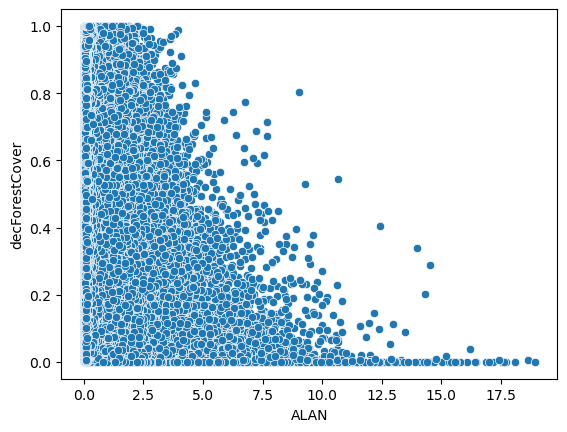

In [11]:
sns.scatterplot(data=df, x='ALAN', y='decForestCover')
plt.show()

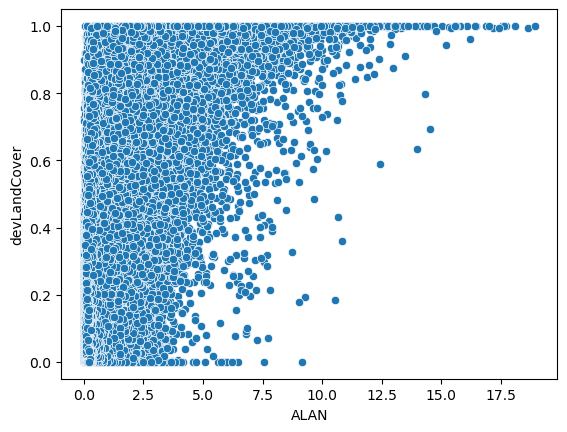

In [12]:
sns.scatterplot(data=df, x='ALAN', y='devLandCover')
plt.show()

In [13]:
ALAN_below_10 = df[df['ALAN'] <= 10]['ALAN']
ALAN_above_10 = df[df['ALAN'] > 10]['ALAN']

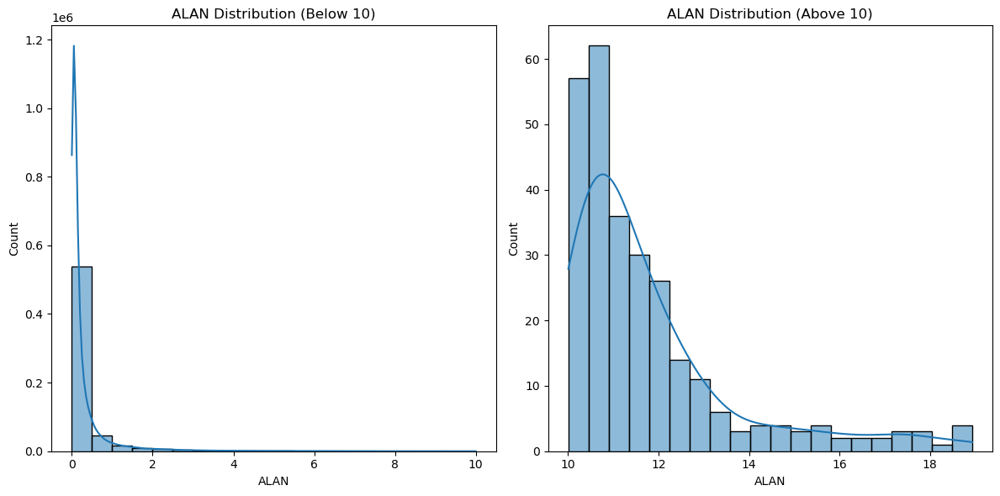

In [14]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(ALAN_below_10, bins=20, kde=True)
plt.title('ALAN Distribution (Below 10)')

plt.subplot(1, 2, 2)
sns.histplot(ALAN_above_10, bins=20, kde=True)
plt.title('ALAN Distribution (Above 10)')

plt.tight_layout()
plt.show()

In [21]:
df = df.drop(columns=['meanVIR'])
df = df.dropna(subset=['ALAN'])

KeyError: "['meanVIR'] not found in axis"

In [22]:
df_sample = df.sample(n=300000, random_state=42)

X = df_sample.drop(columns=['ALAN'])
y = df_sample['ALAN']

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [24]:
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "LASSO Regression": Lasso(alpha=0.1),
    "Random Forest": RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42, n_jobs=1)
}

# Train and evaluate
results = []
trained_models = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    trained_models[name] = model
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results.append((name, r2, rmse))

# Display results
results_df = pd.DataFrame(results, columns=["Model", "R^2", "RMSE"])
print(results_df)

KeyboardInterrupt: 

In [ ]:
rf = trained_models["Random Forest"]
feature_names = X_train.columns 
importances = rf.feature_importances_

# Confirm dimensions match
print(f"Number of features: {len(feature_names)}")
print(f"Number of importances: {len(importances)}")

# Create DataFrame and plot
feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp_df, x='Importance', y='Feature', palette='viridis')
plt.title('Random Forest Feature Importances')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.tree import plot_tree

plt.figure(figsize=(50, 20))
plot_tree(rf.estimators_[0], filled=True, feature_names=X_train.columns, max_depth=4)
plt.title('Random Forest - One Decision Tree')
plt.show()